# Image Filtering
Analyze information of neighboring pixels and apply linear or non-linear filters

# Libraries

In [1]:
using Images

# Image

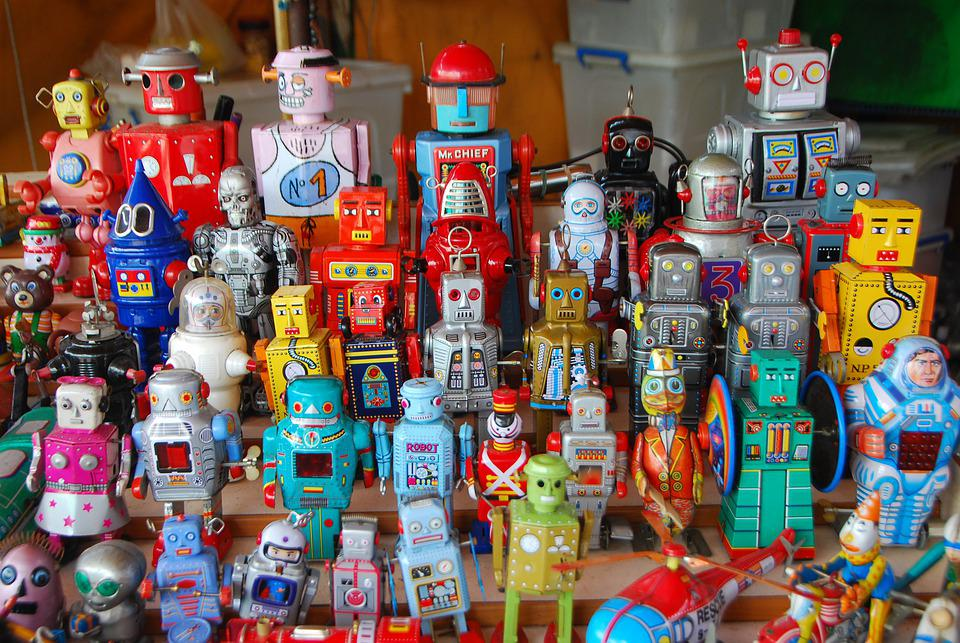

In [2]:
image_path = "Images/robots.jpg"
o_img = load(image_path)

## Padding Images
Add borders to your image

### a) Padding with a constant value

In [3]:
# We want a 25-pixel border around an image
pad_h = 100
pad_v = 200

pad_color = RGB4{N0f8}(0.5, 0.5, 0.0) #Border Color

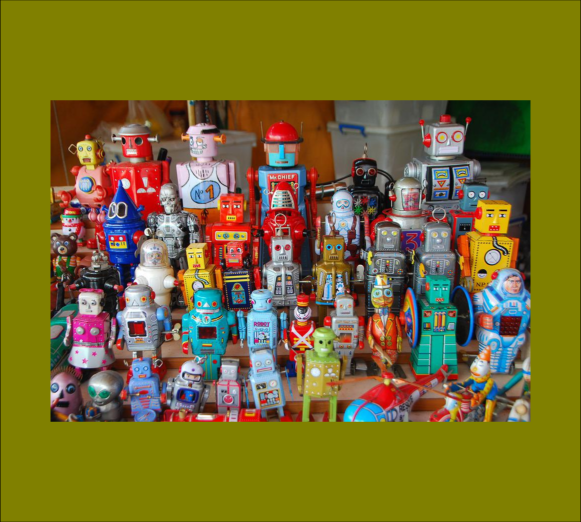

In [4]:
img = padarray(o_img, Fill(pad_color, (pad_v, pad_h)));
img = parent(img) # reset indices to start from 1

# We use `parent` to reset indices to start from 1 after using padarray

### Padding by duplicating content of an image. 

#### a) Padding type: Replicate
The border pixels extend beyond the image boundaries.

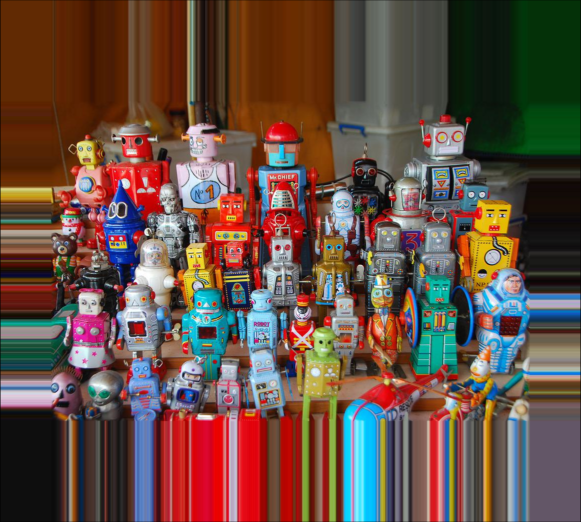

In [5]:
img = parent(padarray(o_img, Pad(:replicate, pad_v, pad_h)))
# We use `parent` to reset indices to start from 1 after using padarray

#### b) Padding type: Circular
The border pixels wrap around

In [6]:
img = parent(padarray(o_img, Pad(:circular, pad_v, pad_h)));
# We use `parent` to reset indices to start from 1 after using padarray

#### b) Padding type: Symmetric
The border pixels reflect relative to a position between pixels.

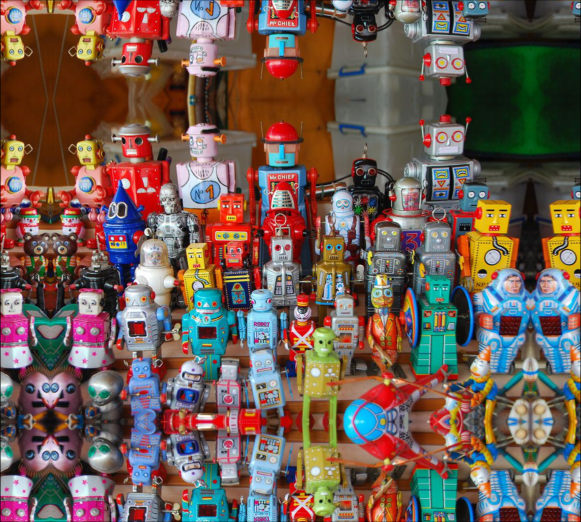

In [7]:
img = padarray(o_img, Pad(:symmetric, pad_v, pad_h));
img = parent(img) # reset indices to start from 1 after using padarray

#### d) Padding type: Reflect
The border pixels reflect relative to edge itself

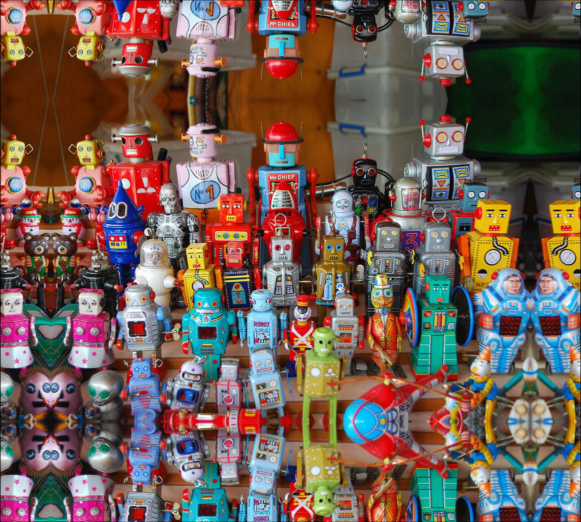

In [8]:
img = padarray(o_img, Pad(:reflect, pad_v, pad_h));
img = parent(img) # reset indices to start from 1 after using padarray

# Blurring with the Gaussian Kernel

The gaussian kernel replaces a pixel with the median value of the pixels around it. Should be a positive integer. 

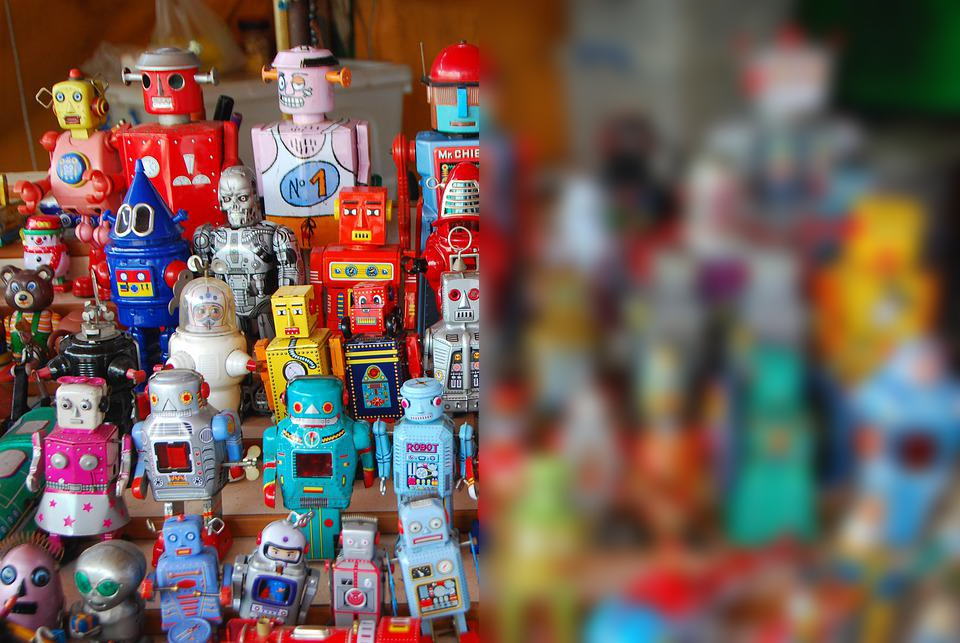

In [10]:
function blurr_right_half(image_path, σ = 3)
    img = load(image_path)
    
    img_size = size(img)
    
    area_to_blur = trunc(Int, img_size[2] / 2):img_size[2];
    
    area_to_blur_img = img[:, area_to_blur]
    
    blurred_half = imfilter(area_to_blur_img, Kernel.gaussian(σ))
    
    img[:, area_to_blur] = blurred_half
    
    return img
end

# Blurring the right size of an image 
blurr_right_half(image_path, 10)

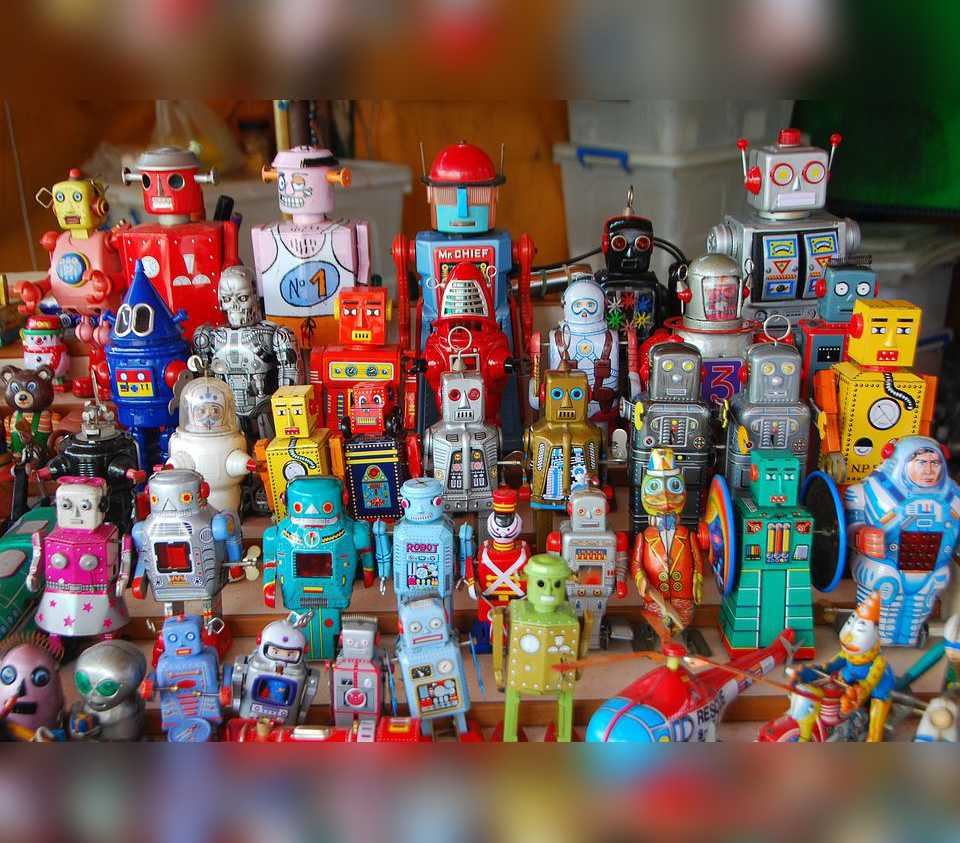

In [38]:
function blur_top_bottom_borders(image_path, pad_v, σ)
    
    img = load(image_path)
    
    # add borders
    img = parent(padarray(img, Pad(:reflect, pad_v, 0)));
    
    # apply blurring to top border
    blur_area_top = 1:pad_v
    img[blur_area_top, :] = imfilter(img[blur_area_top, :], Kernel.gaussian(σ))

    # apply blurring to bottom border
    blur_area_bottom = size(img, 1)-pad_v:size(img, 1)
    img[blur_area_bottom, :] = imfilter(img[blur_area_bottom, :], Kernel.gaussian(σ))    

    return img    
end 

blur_top_bottom_borders(image_path, 100, 20)    

# Sharpening images
1. Apply Gaussian smoothing filter to a copy of an image.
2. Substract smoothed image from original in a way so that the values of a constant area remain constant.

In [43]:
gaussian_smoothing = 1
intens

1

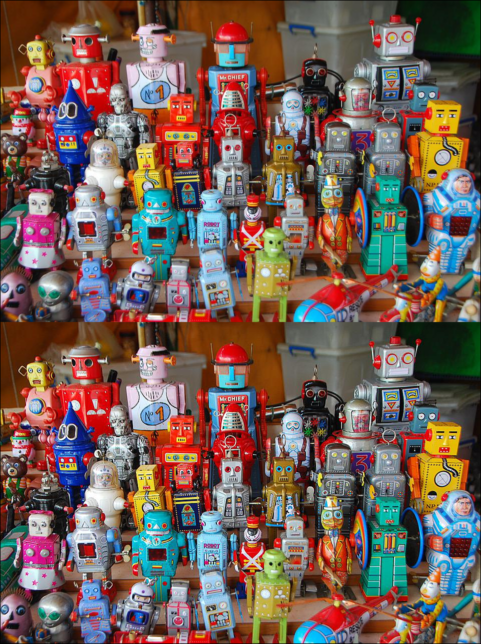

In [54]:
function sharpened_image(img, gaussian_smoothing, intensity, mosaic = true)
    """
    Input:
    * gaussian_smoothing ∈ [1, 4] (reccommended)
    * intensity ∈ [0.5, 1] (reccommended)
    """
    
    blurred_img = imfilter(img, Kernel.gaussian(gaussian_smoothing));
    
    # To perform mathematical operations, we convert to Float.
    img_array = Float16.(channelview(img));
    blurred_img_array = Float16.(channelview(blurred_img));
    
    # Sharpen image. Fix values from 0 to 1
    sharpened_img = img_array.*(1+intensity) .+blurred_img_array .*(-intensity)
    sharpened_img = max.(sharpened_img, 0)
    sharpened_img = min.(sharpened_img, 1)
    sharpened_img = colorview(RGB, sharpened_img)
    
    return mosaic_output_1d(img, sharpened_img, mosaic)
    
end; 

img = load(image_path);
sharpened_image(image_path, 1, 1)